<a href="https://colab.research.google.com/github/joshmuhu/computer_vision/blob/main/Banana_cassava_YOLOv5_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#YOLOv5 model for detecting banana and cassava in a garden

The following steps were followed

1. The images are annotated with roboflow with two classes banana and cassava
2. Turned into grayscale and resized to 224*224
3. They are then augmented through the use of variations in brightness.
4. The dataset is then broken down into train, test and validation with train: 94%, validation: 4%, test: 2% i.e 4700 images: 181 images: 91 images.
5. The dataset is then exported in a YOLOV5 PyTorch format and applied to the YOLOV5 deep learning model
6. The following parameters are tuned to the following values: epochs: 146, batch-size:16, image-size 416, and weights for transfer learning from the COCO pre-trained checkpoint. We use caching for faster training
7. After training, we run a reference with the trained weights on the test images folder
8. Model evaluation is done while using tensorboard that helps in providing the different metrics



Step 1: Requirements installation

In [ ]:
#clone YOLOv5 repo
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12898, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 12898 (delta 32), reused 38 (delta 23), pack-reused 12844
Receiving objects: 100% (12898/12898), 13.07 MiB | 6.24 MiB/s, done.
Resolving deltas: 100% (8862/8862), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 48.3 MB/s 
     |████████████████████████████████| 145 kB 38.1 MB/s 
     |████████████████████████████████| 178 kB 70.1 MB/s 
     |████████████████████████████████| 1.1 MB 58.0 MB/s 
     |████████████████████████████████| 67 kB 6.1 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 138 kB 71.9 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


Step 2: Dataset Assembling


1.   Read the YOLOV5 pytorch format from roboflow
2.   Provide the api key



In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:

# installing roboflow
!pip install roboflow
# providing the api key
from roboflow import Roboflow
rf = Roboflow(api_key="1jdRIYnXesUccaCSva8D")
project = rf.workspace("mcsvision").project("banana-cassava")
dataset = project.version(4).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/banana-cassava-4 in yolov5pytorch:: 100%|██████████| 9886/9886 [00:02<00:00, 3705.58it/s]


Step 3: Training

Variations are made in the following paramters
- **img:** input image size
- **batch:**  batch size
- **epochs:** the number of training epochs
- **data:** dataset downloaded from roboflow
- **weights:** using coco pretrained weights and checkpoint for our training (transfer learning)
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 146 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/banana-cassava-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=146, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-178-g799e3d0 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hs

Step 4:Evaluating the model using tensorboard


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Step 5: Running Inference  With Trained Weights against the test data


In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/banana-cassava-4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-178-g799e3d0 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/91 /content/datasets/banana-cassava-4/test/images/frame103_jpg.rf.f47e925d14d4753611e438ab6df300c4.jpg: 416x416 3 bananas, 4 cassavas, 8.3ms
image 2/91 /content/datasets/banana-cassava-4/test/images/frame119_jpg.rf.48439c285c8aceb4d930b804f801c9da.jpg: 416x416 3 bananas, 5 cassavas, 8.2ms
image 3/91 /content/da

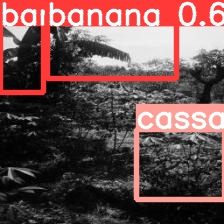

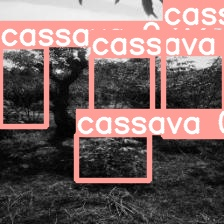

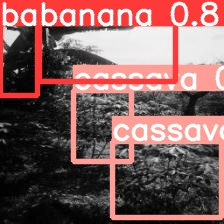

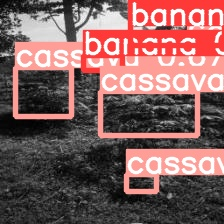

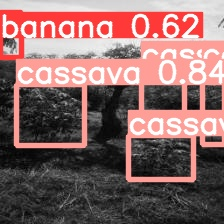

...

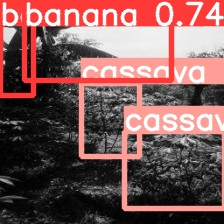

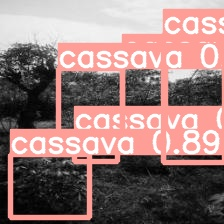

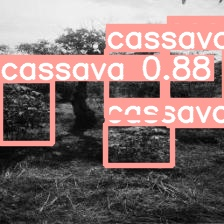

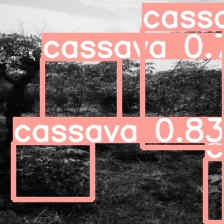

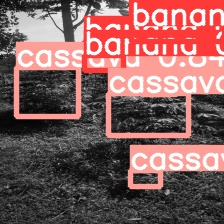

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#export model for future application deployment
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>